# Court Predict: NCAA Tournament Showdown

## Preperations

### libraries

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import os

import plotly.express as px
from plotly.subplots import make_subplots
import folium
import plotly.graph_objects as go

px_color = px.colors.qualitative.G10    

### Data Collection

**Importing all files and save them into Dataframes**

In [2]:
file_directory = r'C:\\python practice\\machine learning\\NCAA_project\\data'

files = os.listdir(file_directory)
dataframe_names = []

for file_name in files:
    if file_name.endswith('.csv'):
        df_name = file_name.split('.')[0]
        globals()[df_name] = pd.read_csv(os.path.join(file_directory, file_name), encoding='latin1')

        dataframe_names.append(df_name)

**Printing all dataframe names at once**

In [3]:
for df_name in dataframe_names:
    print(df_name)

2024_tourney_seeds
Cities
Conferences
fivethirtyeight_ncaa_forecasts_2023
MConferenceTourneyGames
MGameCities
MMasseyOrdinals
MNCAATourneyCompactResults
MNCAATourneyDetailedResults
MNCAATourneySeedRoundSlots
MNCAATourneySeeds
MNCAATourneySlots
MRegularSeasonCompactResults
MRegularSeasonDetailedResults
MSeasons
MSecondaryTourneyCompactResults
MSecondaryTourneyTeams
MTeamCoaches
MTeamConferences
MTeams
MTeamSpellings
sample_submission
WGameCities
WNCAATourneyCompactResults
WNCAATourneyDetailedResults
WNCAATourneySeeds
WNCAATourneySlots
WRegularSeasonCompactResults
WRegularSeasonDetailedResults
WSeasons
WTeamConferences
WTeams
WTeamSpellings


### Data Cleaning

In [4]:
# Creating a list of DataFrame names
dataframe_names = [df_name for df_name in globals() if isinstance(globals()[df_name], pd.DataFrame)]

# Checking for null values in all DataFrames
for df_name in dataframe_names:
    df = globals()[df_name]
    if df.isnull().values.any():
        print(f"DataFrame: {df_name}")
        print(df[df.isnull().any(axis=1)])
        print("\n")
    else:
        print(f"No null values found in DataFrame: {df_name}")


No null values found in DataFrame: 2024_tourney_seeds
No null values found in DataFrame: Cities
No null values found in DataFrame: Conferences
No null values found in DataFrame: fivethirtyeight_ncaa_forecasts_2023
No null values found in DataFrame: MConferenceTourneyGames
No null values found in DataFrame: MGameCities
No null values found in DataFrame: MMasseyOrdinals
No null values found in DataFrame: MNCAATourneyCompactResults
No null values found in DataFrame: MNCAATourneyDetailedResults
No null values found in DataFrame: MNCAATourneySeedRoundSlots
No null values found in DataFrame: MNCAATourneySeeds
No null values found in DataFrame: MNCAATourneySlots
No null values found in DataFrame: MRegularSeasonCompactResults
No null values found in DataFrame: MRegularSeasonDetailedResults
No null values found in DataFrame: MSeasons
No null values found in DataFrame: MSecondaryTourneyCompactResults
No null values found in DataFrame: MSecondaryTourneyTeams
No null values found in DataFrame: MTe

**Therefore no null values in the dataset**

## Exploratory Data Analysis (EDA)

### data section 1: the basics
MTeams.csv and WTeams.csv

In [5]:
MTeams.columns

Index(['TeamID', 'TeamName', 'FirstD1Season', 'LastD1Season'], dtype='object')

In [6]:
MTeams.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 378 entries, 0 to 377
Data columns (total 4 columns):
 #   Column         Non-Null Count  Dtype 
---  ------         --------------  ----- 
 0   TeamID         378 non-null    int64 
 1   TeamName       378 non-null    object
 2   FirstD1Season  378 non-null    int64 
 3   LastD1Season   378 non-null    int64 
dtypes: int64(3), object(1)
memory usage: 11.9+ KB


In [7]:
WTeams.columns

Index(['TeamID', 'TeamName'], dtype='object')

In [8]:
WTeams.columns

Index(['TeamID', 'TeamName'], dtype='object')

In [9]:
# to display all columns
pd.set_option('display.max_columns', None)

In [10]:

MTeams.head()

,TeamID,TeamName,FirstD1Season,LastD1Season
0,1101,Abilene Chr,2014,2024
1,1102,Air Force,1985,2024
2,1103,Akron,1985,2024
3,1104,Alabama,1985,2024
4,1105,Alabama A&M,2000,2024


In [11]:
WTeams.head()

,TeamID,TeamName
0,3101,Abilene Chr
1,3102,Air Force
2,3103,Akron
3,3104,Alabama
4,3105,Alabama A&M


In [12]:
print(f'total teams of men: {MTeams.shape[0]}')
print(f"Teams with unique Team name of men: {len(MTeams['TeamName'].unique())} ")
print(f"Teams with unique Team ID of men: {len(MTeams['TeamID'].unique())}" )
print('\n')
print(f'total teams of women: {WTeams.shape[0]}')
print(f"Teams with unique Team name of women: {len(WTeams['TeamName'].unique())} ")
print(f"Teams with unique Team ID of women: {len(WTeams['TeamID'].unique())}")

total teams of men: 378
Teams with unique Team name of men: 378 
Teams with unique Team ID of men: 378


total teams of women: 376
Teams with unique Team name of women: 376 
Teams with unique Team ID of women: 376


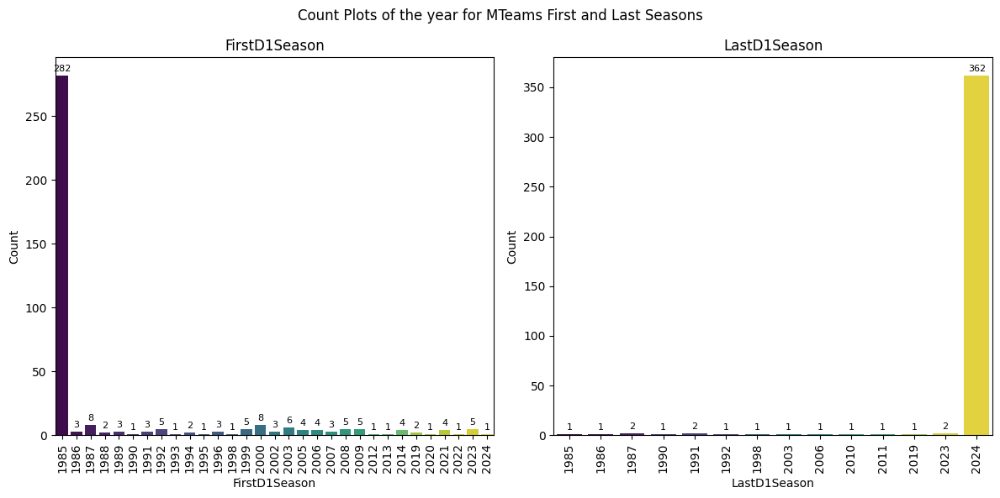

In [13]:
plt.figure(figsize=(12, 6))

plt.subplot(1, 2, 1)
sns.countplot(data=MTeams, x='FirstD1Season', hue='FirstD1Season', palette='viridis', legend=False)
plt.title('FirstD1Season')
plt.xlabel('FirstD1Season')
plt.ylabel('Count')
plt.xticks(rotation=90)

for p in plt.gca().patches:
    plt.gca().annotate(f'\n{int(p.get_height())}', (p.get_x() + p.get_width() / 2., p.get_height()),
                        ha='center', va='center', fontsize=8, color='black', xytext=(0, 10),
                        textcoords='offset points')

plt.subplot(1, 2, 2)
sns.countplot(data=MTeams, x='LastD1Season', hue='LastD1Season', palette='viridis', legend=False)
plt.title('LastD1Season')
plt.xlabel('LastD1Season')
plt.ylabel('Count')
plt.xticks(rotation=90)

for p in plt.gca().patches:
    plt.gca().annotate(f'\n{int(p.get_height())}', (p.get_x() + p.get_width() / 2., p.get_height()),
                        ha='center', va='center', fontsize=8, color='black', xytext=(0, 10),
                        textcoords='offset points')

plt.suptitle('Count Plots of the year for MTeams First and Last Seasons')
plt.tight_layout()
plt.show()


### data section 1: the basics
MSeasons.csv and WSeasons.csv

In [14]:
MSeasons.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 40 entries, 0 to 39
Data columns (total 6 columns):
 #   Column   Non-Null Count  Dtype 
---  ------   --------------  ----- 
 0   Season   40 non-null     int64 
 1   DayZero  40 non-null     object
 2   RegionW  40 non-null     object
 3   RegionX  40 non-null     object
 4   RegionY  40 non-null     object
 5   RegionZ  40 non-null     object
dtypes: int64(1), object(5)
memory usage: 2.0+ KB


In [15]:
WSeasons.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 27 entries, 0 to 26
Data columns (total 6 columns):
 #   Column   Non-Null Count  Dtype 
---  ------   --------------  ----- 
 0   Season   27 non-null     int64 
 1   DayZero  27 non-null     object
 2   RegionW  27 non-null     object
 3   RegionX  27 non-null     object
 4   RegionY  27 non-null     object
 5   RegionZ  27 non-null     object
dtypes: int64(1), object(5)
memory usage: 1.4+ KB


In [16]:
MSeasons.head()

,Season,DayZero,RegionW,RegionX,RegionY,RegionZ
0,1985,10/29/1984,East,West,Midwest,Southeast
1,1986,10/28/1985,East,Midwest,Southeast,West
2,1987,10/27/1986,East,Southeast,Midwest,West
3,1988,11/2/1987,East,Midwest,Southeast,West
4,1989,10/31/1988,East,West,Midwest,Southeast


In [17]:
WSeasons.head()

,Season,DayZero,RegionW,RegionX,RegionY,RegionZ
0,1998,10/27/1997,East,Midwest,Mideast,West
1,1999,10/26/1998,East,Mideast,Midwest,West
2,2000,11/1/1999,East,Midwest,Mideast,West
3,2001,10/30/2000,East,Midwest,Mideast,West
4,2002,10/29/2001,East,West,Mideast,Midwest


In [18]:
MSeasons['DayZero'] = pd.to_datetime(MSeasons['DayZero'])
WSeasons['DayZero'] = pd.to_datetime(WSeasons['DayZero'])

M_DayZero_date = MSeasons['DayZero'].dt.strftime('%m-%d')
W_DayZero_date = WSeasons['DayZero'].dt.strftime('%m-%d')

M_all_Region =  pd.concat([MSeasons['RegionW'], MSeasons['RegionX'], MSeasons['RegionY'], MSeasons['RegionZ']])
W_all_Region =  pd.concat([WSeasons['RegionW'], WSeasons['RegionX'], WSeasons['RegionY'], WSeasons['RegionZ']])

print(f"We have {MSeasons.shape[0]} Seasons for men")
print(f"We have {len(MSeasons['Season'].unique())} unique Seasons of men")

M_all_Region_unique = len(M_all_Region.unique())
W_all_Region_unique = len(W_all_Region.unique())
print(f"For men, we have {M_all_Region_unique} unique regions")
print(f"For women, we have {W_all_Region_unique} unique regions")


We have 40 Seasons for men
We have 40 unique Seasons of men
For men, we have 25 unique regions
For women, we have 54 unique regions


C:\Users\ramsh\AppData\Local\Temp\ipykernel_5796\1268165383.py:5: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=categories, y=counts, palette='viridis')


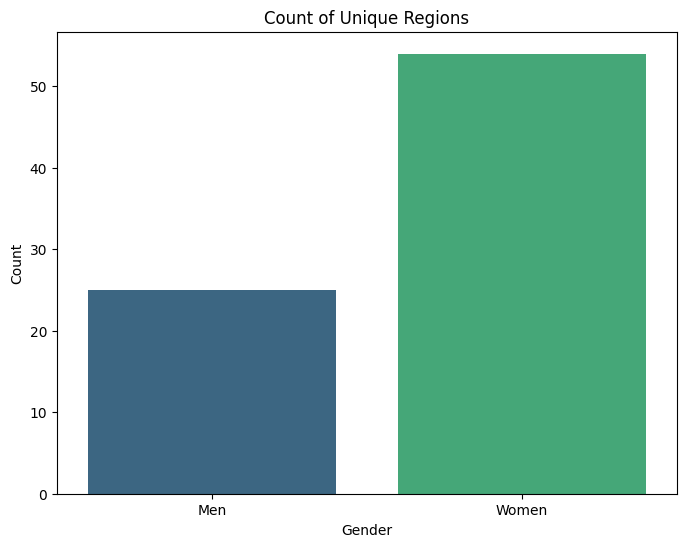

In [19]:
categories = ['Men', 'Women']
counts = [M_all_Region_unique, W_all_Region_unique]

plt.figure(figsize=(8, 6))
sns.barplot(x=categories, y=counts, palette='viridis')
plt.title('Count of Unique Regions')
plt.xlabel('Gender')
plt.ylabel('Count')
plt.show()

In [20]:
print(f"For men's seasons, \nthe earliest Season year is: {min(MSeasons['Season'])} \nthe latest Season year is: {max(MSeasons['Season'])}")

print(f"\nthe earliest recorded starting date is: {min(M_DayZero_date)} \nthe latest recorded starting date is: {max(M_DayZero_date)}")


For men's seasons, 
the earliest Season year is: 1985 
the latest Season year is: 2024

the earliest recorded starting date is: 10-26 
the latest recorded starting date is: 11-06


In [21]:
print(f"For Women's seasons, \nthe earliest Season year is: {min(WSeasons['Season'])} \nthe latest Season year is: {max(WSeasons['Season'])}")

print(f"\nthe earliest recorded starting date is {min(W_DayZero_date)} \nthe latest recorded starting date is: {max(W_DayZero_date)}")


For Women's seasons, 
the earliest Season year is: 1998 
the latest Season year is: 2024

the earliest recorded starting date is 10-26 
the latest recorded starting date is: 11-06


### data section 1: the basics
MNCAATourneySeeds.csv and WNCAATourneySeeds.csv

In [22]:
MNCAATourneySeeds.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2490 entries, 0 to 2489
Data columns (total 3 columns):
 #   Column  Non-Null Count  Dtype 
---  ------  --------------  ----- 
 0   Season  2490 non-null   int64 
 1   Seed    2490 non-null   object
 2   TeamID  2490 non-null   int64 
dtypes: int64(2), object(1)
memory usage: 58.5+ KB


In [23]:
WNCAATourneySeeds.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1608 entries, 0 to 1607
Data columns (total 3 columns):
 #   Column  Non-Null Count  Dtype 
---  ------  --------------  ----- 
 0   Season  1608 non-null   int64 
 1   Seed    1608 non-null   object
 2   TeamID  1608 non-null   int64 
dtypes: int64(2), object(1)
memory usage: 37.8+ KB


In [24]:
MNCAATourneySeeds.head()

,Season,Seed,TeamID
0,1985,W01,1207
1,1985,W02,1210
2,1985,W03,1228
3,1985,W04,1260
4,1985,W05,1374


In [25]:
WNCAATourneySeeds.head()

,Season,Seed,TeamID
0,1998,W01,3330
1,1998,W02,3163
2,1998,W03,3112
3,1998,W04,3301
4,1998,W05,3272


In [26]:
print(f'there are number of seed for Men: {MNCAATourneySeeds.shape[0]}')
print(f'there are number of seed for Women: {WNCAATourneySeeds.shape[0]}')

there are number of seed for Men: 2490
there are number of seed for Women: 1608


In [27]:
print(f"The min number of seed by Season is {min(MNCAATourneySeeds['Season'].value_counts())} max is {max(MNCAATourneySeeds['Season'].value_counts())} for men")
print("\n")
print(f"The min number of seed by Season is {min(WNCAATourneySeeds['Season'].value_counts())} and max is {max(WNCAATourneySeeds['Season'].value_counts())} for women")

The min number of seed by Season is 64 max is 68 for men


The min number of seed by Season is 64 and max is 68 for women


### Merged Teams, NCAATourneySeeds, Seasons for men and women 

In [28]:
M_df1 = MTeams.copy()

M_df1 = M_df1.merge(MNCAATourneySeeds, on=['TeamID'])

M_df1 = M_df1.merge(MSeasons, on=['Season'])
M_df1.head()

,TeamID,TeamName,FirstD1Season,LastD1Season,Season,Seed,DayZero,RegionW,RegionX,RegionY,RegionZ
0,1101,Abilene Chr,2014,2024,2019,Y15,2018-11-05,East,West,Midwest,South
1,1101,Abilene Chr,2014,2024,2021,W14,2020-11-02,East,West,Midwest,South
2,1102,Air Force,1985,2024,2004,W11,2003-11-03,Atlanta,Phoenix,EastRutherford,StLouis
3,1102,Air Force,1985,2024,2006,Z13,2005-10-31,Atlanta,Oakland,Minneapolis,WashingtonDC
4,1103,Akron,1985,2024,1986,X15,1985-10-28,East,Midwest,Southeast,West


In [29]:
W_df1 = WTeams.copy()

W_df1 = W_df1.merge(WNCAATourneySeeds, on=['TeamID'])

W_df1 = W_df1.merge(WSeasons, on=['Season'])
W_df1.head()

,TeamID,TeamName,Season,Seed,DayZero,RegionW,RegionX,RegionY,RegionZ
0,3101,Abilene Chr,2019,Y16,2018-11-05,Albany,Chicago,Greensboro,Portland
1,3103,Akron,2014,Z13,2013-11-04,Lincoln,Stanford,Louisville,NotreDame
2,3104,Alabama,1998,X02,1997-10-27,East,Midwest,Mideast,West
3,3104,Alabama,1999,Y05,1998-10-26,East,Mideast,Midwest,West
4,3104,Alabama,2021,X07,2020-11-02,Alamo,Hemisfair,Mercado,RiverWalk


### data section 1: the basics
MRegularSeasonCompactResults.csv and WRegularSeasonCompactResults.csv

In [30]:
MRegularSeasonCompactResults.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 185865 entries, 0 to 185864
Data columns (total 8 columns):
 #   Column   Non-Null Count   Dtype 
---  ------   --------------   ----- 
 0   Season   185865 non-null  int64 
 1   DayNum   185865 non-null  int64 
 2   WTeamID  185865 non-null  int64 
 3   WScore   185865 non-null  int64 
 4   LTeamID  185865 non-null  int64 
 5   LScore   185865 non-null  int64 
 6   WLoc     185865 non-null  object
 7   NumOT    185865 non-null  int64 
dtypes: int64(7), object(1)
memory usage: 11.3+ MB


In [31]:
WRegularSeasonCompactResults.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 130235 entries, 0 to 130234
Data columns (total 8 columns):
 #   Column   Non-Null Count   Dtype 
---  ------   --------------   ----- 
 0   Season   130235 non-null  int64 
 1   DayNum   130235 non-null  int64 
 2   WTeamID  130235 non-null  int64 
 3   WScore   130235 non-null  int64 
 4   LTeamID  130235 non-null  int64 
 5   LScore   130235 non-null  int64 
 6   WLoc     130235 non-null  object
 7   NumOT    130235 non-null  int64 
dtypes: int64(7), object(1)
memory usage: 7.9+ MB


In [32]:
MRegularSeasonCompactResults.head()

,Season,DayNum,WTeamID,WScore,LTeamID,LScore,WLoc,NumOT
0,1985,20,1228,81,1328,64,N,0
1,1985,25,1106,77,1354,70,H,0
2,1985,25,1112,63,1223,56,H,0
3,1985,25,1165,70,1432,54,H,0
4,1985,25,1192,86,1447,74,H,0


In [33]:
WRegularSeasonCompactResults.head()

,Season,DayNum,WTeamID,WScore,LTeamID,LScore,WLoc,NumOT
0,1998,18,3104,91,3202,41,H,0
1,1998,18,3163,87,3221,76,H,0
2,1998,18,3222,66,3261,59,H,0
3,1998,18,3307,69,3365,62,H,0
4,1998,18,3349,115,3411,35,H,0


In [34]:
men_scores = MRegularSeasonCompactResults['WScore']
women_scores = WRegularSeasonCompactResults['WScore']

trace_men = go.Histogram(x=men_scores, name='Men', opacity=0.5)
trace_women = go.Histogram(x=women_scores, name='Women', opacity=0.5)

layout = go.Layout(
    title='Game Scores Comparison',
    xaxis=dict(title='Score'),
    yaxis=dict(title='Frequency'),
    barmode='overlay',
    legend=dict(yanchor="top", y=0.99, xanchor="left", x=0.01),
)

fig = go.Figure(data=[trace_men, trace_women], layout=layout)
fig.show()


In [35]:
men_home_away = MRegularSeasonCompactResults['WLoc'].value_counts()
men_labels = men_home_away.index
men_values = men_home_away.values

women_home_away = WRegularSeasonCompactResults['WLoc'].value_counts()
women_labels = women_home_away.index
women_values = women_home_away.values

fig = go.Figure()

fig.add_trace(go.Bar(x=men_labels, y=men_values, name='Men', marker_color='blue'))
fig.add_trace(go.Bar(x=women_labels, y=women_values, name='Women', marker_color='orange'))

fig.update_layout(
    title='Home vs. Away vs. Neutral Performance',
    xaxis_title='Location',
    yaxis_title='Number of Games',
    legend=dict(
        orientation='v',
        x=1.02,
        y=1,
        bgcolor='rgba(255, 255, 255, 0.5)',
        bordercolor='rgba(0, 0, 0, 0.5)',
        borderwidth=1
    ),
    barmode='group'
)

fig.show()


In [36]:

men_avg_score = MRegularSeasonCompactResults.groupby('Season')['WScore'].mean().reset_index()
women_avg_score = WRegularSeasonCompactResults.groupby('Season')['WScore'].mean().reset_index()

fig = px.line()
fig.add_scatter(x=men_avg_score['Season'], y=men_avg_score['WScore'], mode='lines', name='Men')
fig.add_scatter(x=women_avg_score['Season'], y=women_avg_score['WScore'], mode='lines', name='Women')

fig.update_layout(
    title='Scoring Trends Over Time',
    xaxis_title='Season',
    yaxis_title='Average Score',
    legend=dict(yanchor="middle", y=0.99, xanchor="left", x=0.01),
    hovermode='x'
)

fig.show()


### Data Section 2 - Team Box Scores
MRegularSeasonDetailedResults.csv and WRegularSeasonDetailedResults.csv

In [37]:
MRegularSeasonDetailedResults.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 111817 entries, 0 to 111816
Data columns (total 34 columns):
 #   Column   Non-Null Count   Dtype 
---  ------   --------------   ----- 
 0   Season   111817 non-null  int64 
 1   DayNum   111817 non-null  int64 
 2   WTeamID  111817 non-null  int64 
 3   WScore   111817 non-null  int64 
 4   LTeamID  111817 non-null  int64 
 5   LScore   111817 non-null  int64 
 6   WLoc     111817 non-null  object
 7   NumOT    111817 non-null  int64 
 8   WFGM     111817 non-null  int64 
 9   WFGA     111817 non-null  int64 
 10  WFGM3    111817 non-null  int64 
 11  WFGA3    111817 non-null  int64 
 12  WFTM     111817 non-null  int64 
 13  WFTA     111817 non-null  int64 
 14  WOR      111817 non-null  int64 
 15  WDR      111817 non-null  int64 
 16  WAst     111817 non-null  int64 
 17  WTO      111817 non-null  int64 
 18  WStl     111817 non-null  int64 
 19  WBlk     111817 non-null  int64 
 20  WPF      111817 non-null  int64 
 21  LFGM     1

In [38]:
WRegularSeasonDetailedResults.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 74845 entries, 0 to 74844
Data columns (total 34 columns):
 #   Column   Non-Null Count  Dtype 
---  ------   --------------  ----- 
 0   Season   74845 non-null  int64 
 1   DayNum   74845 non-null  int64 
 2   WTeamID  74845 non-null  int64 
 3   WScore   74845 non-null  int64 
 4   LTeamID  74845 non-null  int64 
 5   LScore   74845 non-null  int64 
 6   WLoc     74845 non-null  object
 7   NumOT    74845 non-null  int64 
 8   WFGM     74845 non-null  int64 
 9   WFGA     74845 non-null  int64 
 10  WFGM3    74845 non-null  int64 
 11  WFGA3    74845 non-null  int64 
 12  WFTM     74845 non-null  int64 
 13  WFTA     74845 non-null  int64 
 14  WOR      74845 non-null  int64 
 15  WDR      74845 non-null  int64 
 16  WAst     74845 non-null  int64 
 17  WTO      74845 non-null  int64 
 18  WStl     74845 non-null  int64 
 19  WBlk     74845 non-null  int64 
 20  WPF      74845 non-null  int64 
 21  LFGM     74845 non-null  int64 
 22

In [39]:
MRegularSeasonDetailedResults.head()

,Season,DayNum,WTeamID,WScore,LTeamID,LScore,WLoc,NumOT,WFGM,WFGA,WFGM3,WFGA3,WFTM,WFTA,WOR,WDR,WAst,WTO,WStl,WBlk,WPF,LFGM,LFGA,LFGM3,LFGA3,LFTM,LFTA,LOR,LDR,LAst,LTO,LStl,LBlk,LPF
0,2003,10,1104,68,1328,62,N,0,27,58,3,14,11,18,14,24,13,23,7,1,22,22,53,2,10,16,22,10,22,8,18,9,2,20
1,2003,10,1272,70,1393,63,N,0,26,62,8,20,10,19,15,28,16,13,4,4,18,24,67,6,24,9,20,20,25,7,12,8,6,16
2,2003,11,1266,73,1437,61,N,0,24,58,8,18,17,29,17,26,15,10,5,2,25,22,73,3,26,14,23,31,22,9,12,2,5,23
3,2003,11,1296,56,1457,50,N,0,18,38,3,9,17,31,6,19,11,12,14,2,18,18,49,6,22,8,15,17,20,9,19,4,3,23
4,2003,11,1400,77,1208,71,N,0,30,61,6,14,11,13,17,22,12,14,4,4,20,24,62,6,16,17,27,21,15,12,10,7,1,14


In [40]:
WRegularSeasonDetailedResults.head()

,Season,DayNum,WTeamID,WScore,LTeamID,LScore,WLoc,NumOT,WFGM,WFGA,WFGM3,WFGA3,WFTM,WFTA,WOR,WDR,WAst,WTO,WStl,WBlk,WPF,LFGM,LFGA,LFGM3,LFGA3,LFTM,LFTA,LOR,LDR,LAst,LTO,LStl,LBlk,LPF
0,2010,11,3103,63,3237,49,H,0,23,54,5,9,12,19,10,26,14,18,7,0,15,20,54,3,13,6,10,11,27,11,23,7,6,19
1,2010,11,3104,73,3399,68,N,0,26,62,5,12,16,28,16,31,15,20,5,2,25,25,63,4,21,14,27,14,26,7,20,4,2,27
2,2010,11,3110,71,3224,59,A,0,29,62,6,15,7,12,14,23,18,13,6,2,17,19,58,2,14,19,23,17,23,8,15,6,0,15
3,2010,11,3111,63,3267,58,A,0,27,52,4,11,5,9,6,40,14,27,5,10,18,18,74,6,26,16,25,22,22,15,11,14,5,14
4,2010,11,3119,74,3447,70,H,1,30,74,7,20,7,11,14,33,18,11,5,3,18,25,74,9,17,11,21,21,32,12,14,4,2,14


In [41]:
print(MRegularSeasonDetailedResults.columns)
MRegularSeasonDetailedResults.describe()

Index(['Season', 'DayNum', 'WTeamID', 'WScore', 'LTeamID', 'LScore', 'WLoc',
       'NumOT', 'WFGM', 'WFGA', 'WFGM3', 'WFGA3', 'WFTM', 'WFTA', 'WOR', 'WDR',
       'WAst', 'WTO', 'WStl', 'WBlk', 'WPF', 'LFGM', 'LFGA', 'LFGM3', 'LFGA3',
       'LFTM', 'LFTA', 'LOR', 'LDR', 'LAst', 'LTO', 'LStl', 'LBlk', 'LPF'],
      dtype='object')


,Season,DayNum,WTeamID,WScore,LTeamID,LScore,NumOT,WFGM,WFGA,WFGM3,WFGA3,WFTM,WFTA,WOR,WDR,WAst,WTO,WStl,WBlk,WPF,LFGM,LFGA,LFGM3,LFGA3,LFTM,LFTA,LOR,LDR,LAst,LTO,LStl,LBlk,LPF
count,111817.000000,111817.000000,111817.000000,111817.000000,111817.000000,111817.000000,111817.000000,111817.000000,111817.000000,111817.000000,111817.000000,111817.000000,111817.000000,111817.000000,111817.000000,111817.000000,111817.000000,111817.000000,111817.000000,111817.000000,111817.000000,111817.000000,111817.000000,111817.000000,111817.000000,111817.000000,111817.000000,111817.000000,111817.000000,111817.000000,111817.000000,111817.000000,111817.000000
mean,2013.583391,70.353077,1288.071286,75.723987,1282.685227,63.743617,0.068773,26.336934,55.650858,7.296404,19.172362,15.753714,22.070937,10.448322,25.682866,14.690673,12.690253,6.968869,3.782797,16.809528,22.756128,56.716751,6.175573,20.035442,12.055788,17.737750,10.566882,21.667832,11.400538,14.000635,5.997836,2.865146,18.951430
std,6.197391,35.636641,105.181703,11.010928,104.547042,10.853804,0.305519,4.683253,7.472210,3.107834,5.977565,6.228321,8.098032,4.139285,4.883201,4.417285,4.011853,3.097762,2.424129,4.863843,4.357086,7.574998,2.799326,6.043851,5.342859,7.090475,4.227677,4.525142,3.723971,4.381692,2.748349,2.021141,5.387512
min,2003.000000,0.000000,1101.000000,34.000000,1101.000000,20.000000,0.000000,10.000000,26.000000,0.000000,1.000000,0.000000,0.000000,0.000000,5.000000,1.000000,1.000000,0.000000,0.000000,0.000000,6.000000,26.000000,0.000000,1.000000,0.000000,0.000000,0.000000,4.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,2008.000000,40.000000,1199.000000,68.000000,1191.000000,56.000000,0.000000,23.000000,51.000000,5.000000,15.000000,11.000000,16.000000,7.000000,22.000000,12.000000,10.000000,5.000000,2.000000,14.000000,20.000000,52.000000,4.000000,16.000000,8.000000,13.000000,8.000000,19.000000,9.000000,11.000000,4.000000,1.000000,16.000000
50%,2014.000000,73.000000,1287.000000,75.000000,1281.000000,63.000000,0.000000,26.000000,55.000000,7.000000,19.000000,15.000000,22.000000,10.000000,26.000000,14.000000,12.000000,7.000000,3.000000,17.000000,23.000000,56.000000,6.000000,20.000000,12.000000,17.000000,10.000000,22.000000,11.000000,14.000000,6.000000,3.000000,19.000000
75%,2019.000000,101.000000,1381.000000,83.000000,1374.000000,71.000000,0.000000,29.000000,60.000000,9.000000,23.000000,20.000000,27.000000,13.000000,29.000000,17.000000,15.000000,9.000000,5.000000,20.000000,26.000000,62.000000,8.000000,24.000000,15.000000,22.000000,13.000000,25.000000,14.000000,17.000000,8.000000,4.000000,22.000000
max,2024.000000,132.000000,1478.000000,149.000000,1478.000000,144.000000,6.000000,57.000000,103.000000,26.000000,56.000000,50.000000,67.000000,38.000000,54.000000,41.000000,33.000000,26.000000,21.000000,41.000000,53.000000,106.000000,22.000000,59.000000,42.000000,61.000000,36.000000,49.000000,31.000000,41.000000,22.000000,18.000000,45.000000


In [42]:
print(WRegularSeasonDetailedResults.columns)
WRegularSeasonDetailedResults.describe()

Index(['Season', 'DayNum', 'WTeamID', 'WScore', 'LTeamID', 'LScore', 'WLoc',
       'NumOT', 'WFGM', 'WFGA', 'WFGM3', 'WFGA3', 'WFTM', 'WFTA', 'WOR', 'WDR',
       'WAst', 'WTO', 'WStl', 'WBlk', 'WPF', 'LFGM', 'LFGA', 'LFGM3', 'LFGA3',
       'LFTM', 'LFTA', 'LOR', 'LDR', 'LAst', 'LTO', 'LStl', 'LBlk', 'LPF'],
      dtype='object')


,Season,DayNum,WTeamID,WScore,LTeamID,LScore,NumOT,WFGM,WFGA,WFGM3,WFGA3,WFTM,WFTA,WOR,WDR,WAst,WTO,WStl,WBlk,WPF,LFGM,LFGA,LFGM3,LFGA3,LFTM,LFTA,LOR,LDR,LAst,LTO,LStl,LBlk,LPF
count,74845.000000,74845.000000,74845.000000,74845.00000,74845.000000,74845.000000,74845.000000,74845.000000,74845.000000,74845.000000,74845.000000,74845.000000,74845.000000,74845.000000,74845.000000,74845.000000,74845.000000,74845.000000,74845.000000,74845.000000,74845.000000,74845.000000,74845.000000,74845.000000,74845.000000,74845.000000,74845.000000,74845.000000,74845.000000,74845.000000,74845.000000,74845.000000,74845.000000
mean,2016.846403,69.229060,3284.826334,71.63216,3286.162763,57.233897,0.051800,25.804289,58.957405,6.227363,17.808377,13.796219,19.417663,12.285577,26.811023,14.947171,15.120810,8.645828,3.690734,15.996032,20.876304,58.093406,4.945447,17.837811,10.535841,15.571795,11.570031,22.549937,10.937818,17.211343,7.123602,2.834765,18.145608
std,4.260118,36.018862,103.888320,11.53214,105.154666,10.987635,0.259453,4.972238,7.979277,3.112318,6.615086,5.754202,7.553295,4.747181,5.336363,4.659149,4.654749,3.783587,2.441054,4.386424,4.464258,8.031454,2.658654,6.462380,4.953362,6.650296,4.632283,4.939799,3.802839,5.286381,3.196928,2.072317,4.711353
min,2010.000000,0.000000,3101.000000,30.00000,3101.000000,11.000000,0.000000,9.000000,30.000000,0.000000,0.000000,0.000000,0.000000,0.000000,3.000000,1.000000,1.000000,0.000000,0.000000,0.000000,3.000000,25.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000,1.000000,0.000000,0.000000,0.000000
25%,2013.000000,36.000000,3196.000000,64.00000,3195.000000,50.000000,0.000000,22.000000,53.000000,4.000000,13.000000,10.000000,14.000000,9.000000,23.000000,12.000000,12.000000,6.000000,2.000000,13.000000,18.000000,53.000000,3.000000,13.000000,7.000000,11.000000,8.000000,19.000000,8.000000,13.000000,5.000000,1.000000,15.000000
50%,2017.000000,73.000000,3283.000000,71.00000,3286.000000,57.000000,0.000000,25.000000,59.000000,6.000000,17.000000,13.000000,19.000000,12.000000,27.000000,15.000000,15.000000,8.000000,3.000000,16.000000,21.000000,58.000000,5.000000,17.000000,10.000000,15.000000,11.000000,22.000000,11.000000,17.000000,7.000000,2.000000,18.000000
75%,2020.000000,100.000000,3376.000000,79.00000,3376.000000,64.000000,0.000000,29.000000,64.000000,8.000000,22.000000,17.000000,24.000000,15.000000,30.000000,18.000000,18.000000,11.000000,5.000000,19.000000,24.000000,63.000000,7.000000,22.000000,14.000000,20.000000,14.000000,26.000000,13.000000,20.000000,9.000000,4.000000,21.000000
max,2024.000000,132.000000,3478.000000,140.00000,3478.000000,130.000000,5.000000,58.000000,113.000000,25.000000,58.000000,49.000000,66.000000,45.000000,58.000000,45.000000,40.000000,36.000000,20.000000,37.000000,45.000000,111.000000,25.000000,80.000000,37.000000,52.000000,38.000000,53.000000,34.000000,49.000000,26.000000,17.000000,47.000000


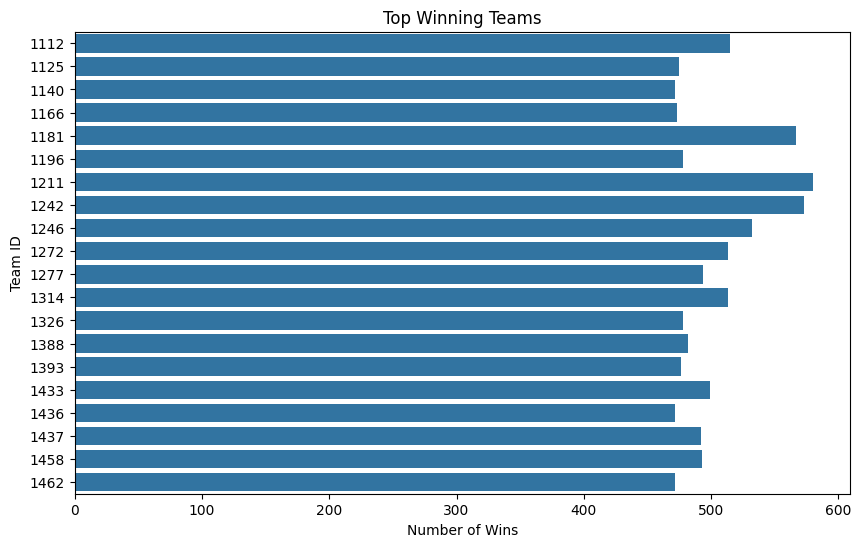

In [43]:
win_counts = MRegularSeasonDetailedResults['WTeamID'].value_counts().reset_index()
win_counts.columns = ['TeamID', 'Wins']
win_counts = win_counts.sort_values(by='Wins', ascending=False).head(20)

plt.figure(figsize=(10, 6))
sns.barplot(x='Wins', y='TeamID', data=win_counts, orient='h')
plt.title('Top Winning Teams')
plt.xlabel('Number of Wins')
plt.ylabel('Team ID')
plt.show()

In [44]:
def make_WL_hist(M_df, W_df, tab_tuple_columns, tab_title=[], nbins=200, colors=('blue', 'orange'), alpha=0.5):
    num_columns = len(tab_tuple_columns)
    fig, axs = plt.subplots(1, 2, figsize=(15, 8), sharey=True)
    fig.suptitle('Histograms for Men and Women', fontsize=16)

    ax = axs[0]
    for col, color in zip(tab_tuple_columns, colors):
        M_df[col].hist(bins=nbins, color=color, alpha=alpha, label=f'Men {col}', ax=ax)
    ax.set_title(tab_title[0] if tab_title else '')
    ax.set_xlabel('')
    ax.set_ylabel('')

    ax = axs[1]
    for col, color in zip(tab_tuple_columns, colors):
        W_df[col].hist(bins=nbins, color=color, alpha=alpha, label=f'Women {col}', ax=ax)
    ax.set_title(tab_title[0] if tab_title else '')
    ax.set_xlabel('')
    ax.set_ylabel('') 

    ax = axs[0]
    handles, labels = ax.get_legend_handles_labels()
    ax.legend(handles, labels)

    ax = axs[1]
    handles, labels = ax.get_legend_handles_labels()
    ax.legend(handles, labels)

    plt.show()


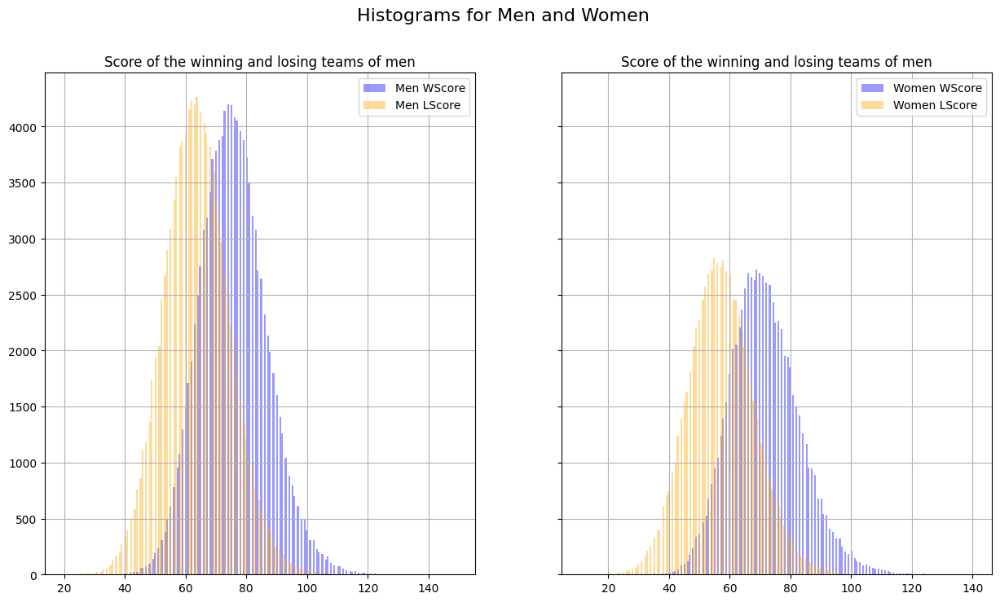

In [45]:
make_WL_hist(
    MRegularSeasonDetailedResults,
    WRegularSeasonDetailedResults,
    ['WScore', 'LScore'], 
    ['Score of the winning and losing teams of men', 'Score of the winning and losing teams of women'],
    colors=('blue', 'orange'),
    alpha=0.4
)


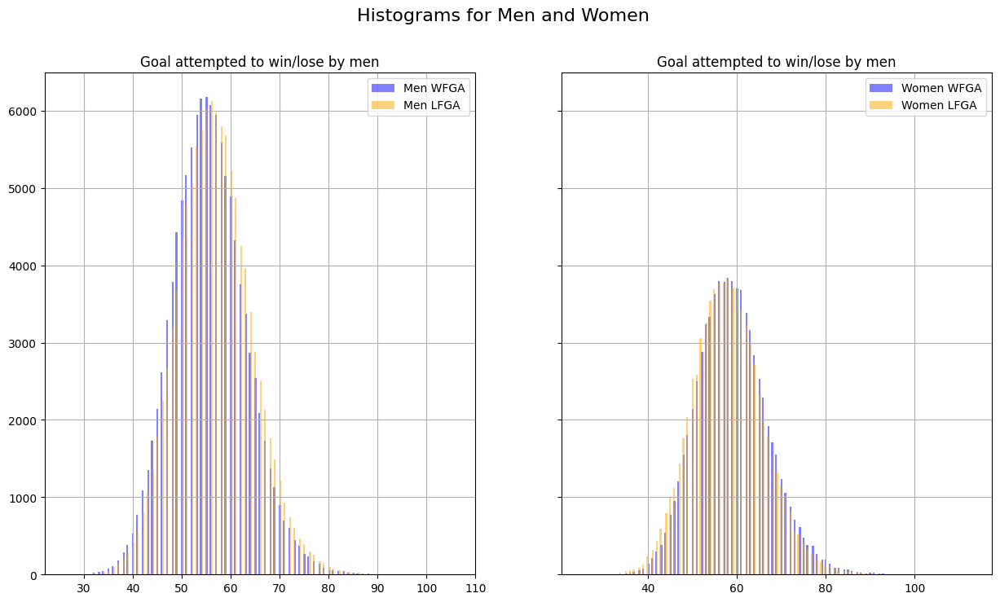

In [46]:
make_WL_hist(
    MRegularSeasonDetailedResults,
    WRegularSeasonDetailedResults,
    ['WFGA', 'LFGA','WFGM','LFGM'], 
    ['Goal attempted to win/lose by men', 'Goal attempted to win/lose by women'],
    alpha=0.5
)


In [47]:
Mprecision =  pd.DataFrame()
Wprecision =  pd.DataFrame()

Mprecision['win'] = MRegularSeasonDetailedResults['WFGM'] / MRegularSeasonDetailedResults['WFGA']
Mprecision['lose'] = MRegularSeasonDetailedResults['LFGM'] / MRegularSeasonDetailedResults['LFGA']

Wprecision['win'] = WRegularSeasonDetailedResults['WFGM'] / WRegularSeasonDetailedResults['WFGA']
Wprecision['lose'] = WRegularSeasonDetailedResults['LFGM'] / WRegularSeasonDetailedResults['LFGA']

print(Mprecision.mean())
print(Wprecision.mean())

win     0.474654
lose    0.402444
dtype: float64
win     0.438880
lose    0.360487
dtype: float64


**we can see that women precision is 4 percent less than men precision score**

**Ploting Precision Shots made by both Men and Women**

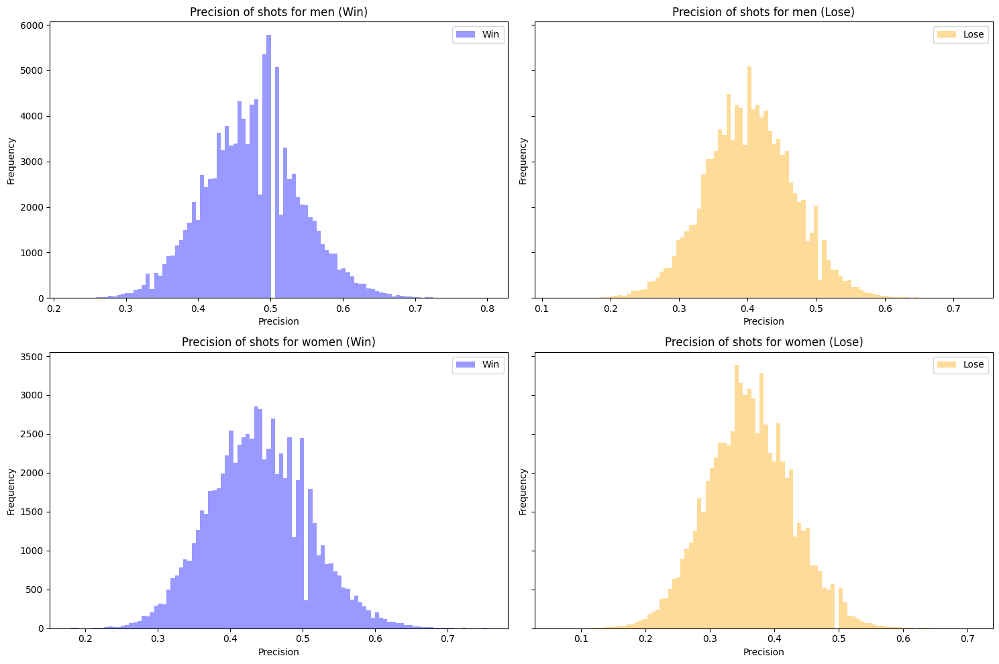

In [48]:
fig, axs = plt.subplots(2, 2, figsize=(15, 10), sharey='row')

# Men - Win
axs[0, 0].hist(Mprecision['win'], bins=100, alpha=0.4, color='blue', label='Win')
axs[0, 0].set_title('Precision of shots for men (Win)')
axs[0, 0].set_xlabel('Precision')
axs[0, 0].set_ylabel('Frequency')
axs[0, 0].legend()
# Men - Lose
axs[0, 1].hist(Mprecision['lose'], bins=100, alpha=0.4, color='orange', label='Lose')
axs[0, 1].set_title('Precision of shots for men (Lose)')
axs[0, 1].set_xlabel('Precision')
axs[0, 1].set_ylabel('Frequency')
axs[0, 1].legend()

# Women - Win
axs[1, 0].hist(Wprecision['win'], bins=100, alpha=0.4, color='blue', label='Win')
axs[1, 0].set_title('Precision of shots for women (Win)')
axs[1, 0].set_xlabel('Precision')
axs[1, 0].set_ylabel('Frequency')
axs[1, 0].legend()
# Women - Lose
axs[1, 1].hist(Wprecision['lose'], bins=100, alpha=0.4, color='orange', label='Lose')
axs[1, 1].set_title('Precision of shots for women (Lose)')
axs[1, 1].set_xlabel('Precision')
axs[1, 1].set_ylabel('Frequency')
axs[1, 1].legend()

plt.tight_layout()
plt.show()


**This Data shows us that the frequency of precision of men winning is high and in case of losing it is low**
**But when we look at the women data is not similar, the women have high frequency of precision but still losing** 
**and the factor responsible for that is spread, we can clearly see that the women losing lhave more frequency but less spread**

**The differing patterns of precision shots between men's and women's basketball teams highlight unique factors influencing performance in each group, including skill levels, playing styles, coaching approaches, etc. Understanding these distinctions is crucial for tailoring training regimens, strategic planning, and player development initiatives to optimize performance outcomes in both men's and women's basketball.**

In [49]:

MRegularSeasonDetailedResults.head()


,Season,DayNum,WTeamID,WScore,LTeamID,LScore,WLoc,NumOT,WFGM,WFGA,WFGM3,WFGA3,WFTM,WFTA,WOR,WDR,WAst,WTO,WStl,WBlk,WPF,LFGM,LFGA,LFGM3,LFGA3,LFTM,LFTA,LOR,LDR,LAst,LTO,LStl,LBlk,LPF
0,2003,10,1104,68,1328,62,N,0,27,58,3,14,11,18,14,24,13,23,7,1,22,22,53,2,10,16,22,10,22,8,18,9,2,20
1,2003,10,1272,70,1393,63,N,0,26,62,8,20,10,19,15,28,16,13,4,4,18,24,67,6,24,9,20,20,25,7,12,8,6,16
2,2003,11,1266,73,1437,61,N,0,24,58,8,18,17,29,17,26,15,10,5,2,25,22,73,3,26,14,23,31,22,9,12,2,5,23
3,2003,11,1296,56,1457,50,N,0,18,38,3,9,17,31,6,19,11,12,14,2,18,18,49,6,22,8,15,17,20,9,19,4,3,23
4,2003,11,1400,77,1208,71,N,0,30,61,6,14,11,13,17,22,12,14,4,4,20,24,62,6,16,17,27,21,15,12,10,7,1,14


In [50]:

team_data = pd.concat([MRegularSeasonDetailedResults[['WTeamID', 'WScore']], MRegularSeasonDetailedResults[['LTeamID', 'LScore']].rename(columns={'LTeamID': 'WTeamID', 'LScore': 'WScore'})])

team_with_lowest_score = team_data.loc[team_data['WScore'] == team_data['WScore'].min(), 'WTeamID'].value_counts().idxmax()

team_with_highest_score = team_data.loc[team_data['WScore'] == team_data['WScore'].max(), 'WTeamID'].value_counts().idxmax()

print("Team ID with the most occurrences of lowest score:", team_with_lowest_score)
print("Team ID with the most occurrences of highest score:", team_with_highest_score)


Team ID with the most occurrences of lowest score: 1387
Team ID with the most occurrences of highest score: 1223


In [51]:

Mprecision_1 =  pd.DataFrame()
Wprecision_1 =  pd.DataFrame()

Mprecision_1['win'] = MRegularSeasonDetailedResults['WFGM3'] / MRegularSeasonDetailedResults['WFGA3']
Mprecision_1['lose'] = MRegularSeasonDetailedResults['LFGM3'] / MRegularSeasonDetailedResults['LFGA3']

Wprecision_1['win'] = WRegularSeasonDetailedResults['WFGM3'] / WRegularSeasonDetailedResults['WFGA3']
Wprecision_1['lose'] = WRegularSeasonDetailedResults['LFGM3'] / WRegularSeasonDetailedResults['LFGA3']

print(Mprecision_1.mean())
print(Wprecision_1.mean())

win     0.379267
lose    0.306287
dtype: float64
win     0.347058
lose    0.274382
dtype: float64


C:\Users\ramsh\AppData\Local\Temp\ipykernel_5796\727851155.py:1: FutureWarning:

The provided callable <built-in function min> is currently using SeriesGroupBy.min. In a future version of pandas, the provided callable will be used directly. To keep current behavior pass the string "min" instead.

C:\Users\ramsh\AppData\Local\Temp\ipykernel_5796\727851155.py:1: FutureWarning:

The provided callable <built-in function max> is currently using SeriesGroupBy.max. In a future version of pandas, the provided callable will be used directly. To keep current behavior pass the string "max" instead.



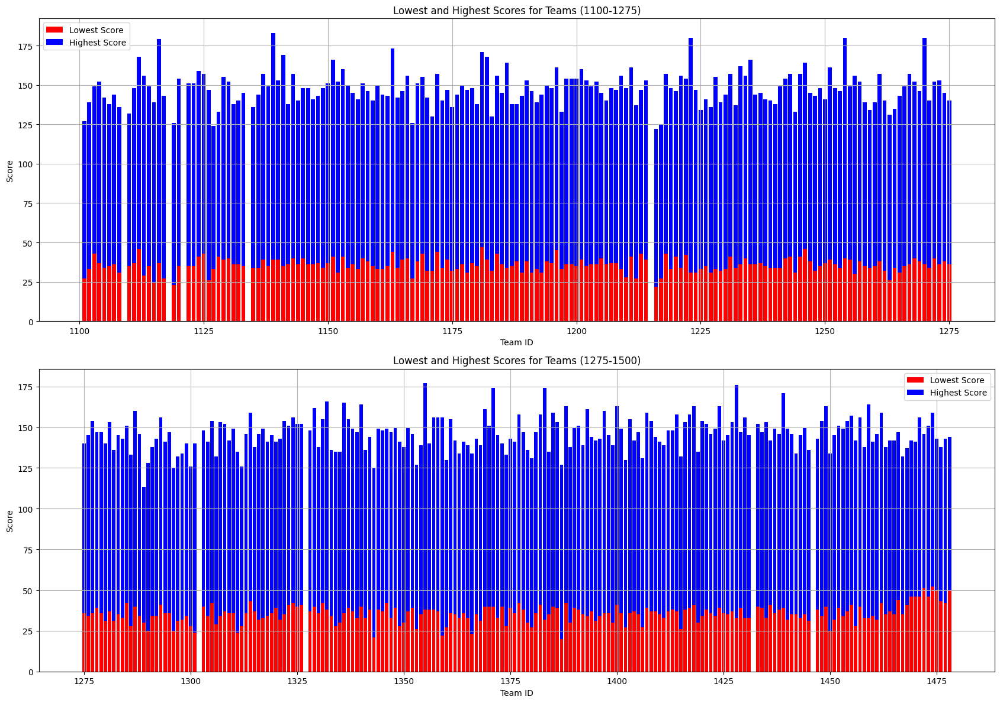

In [52]:
team_scores = team_data.groupby('WTeamID')['WScore'].agg([min, max])

team_scores_1 = team_scores[(team_scores.index >= 1100) & (team_scores.index <= 1275)]
team_scores_2 = team_scores[(team_scores.index >= 1275) & (team_scores.index <= 1500)]

fig, axs = plt.subplots(2, 1, figsize=(17, 12))

bars_1 = axs[0].bar(team_scores_1.index, team_scores_1['min'], color='red', label='Lowest Score')
bars_2 = axs[0].bar(team_scores_1.index, team_scores_1['max'], bottom=team_scores_1['min'], color='blue', label='Highest Score')
axs[0].set_xlabel('Team ID')
axs[0].set_ylabel('Score')
axs[0].set_title('Lowest and Highest Scores for Teams (1100-1275)')
axs[0].legend()
axs[0].grid(True)

axs[1].bar(team_scores_2.index, team_scores_2['min'], color='red', label='Lowest Score')
axs[1].bar(team_scores_2.index, team_scores_2['max'], bottom=team_scores_2['min'], color='blue', label='Highest Score')
axs[1].set_xlabel('Team ID')
axs[1].set_ylabel('Score')
axs[1].set_title('Lowest and Highest Scores for Teams (1275-1500)')
axs[1].legend()
axs[1].grid(True)

plt.tight_layout()
plt.show()


**from above we can see that nearly all the lowest scores are less than 50**
**and nearly all the higher scores more than 125**

**Goal/attempted of free throws of win/lose team of Men and Women**

In [53]:
from plotly.subplots import make_subplots

men_traces = []
for col in ['WFTA', 'WFTM', 'LFTA', 'LFTM']:
    men_traces.append(go.Histogram(x=MRegularSeasonDetailedResults[col], name=col, opacity=0.5))

women_traces = []
for col in ['WFTA', 'WFTM', 'LFTA', 'LFTM']:
    women_traces.append(go.Histogram(x=WRegularSeasonDetailedResults[col], name=col, opacity=0.5))

fig = make_subplots(rows=1, cols=2, subplot_titles=("Men's Basketball", "Women's Basketball"))

for trace in men_traces:
    fig.add_trace(trace, row=1, col=1)

for trace in women_traces:
    fig.add_trace(trace, row=1, col=2)


fig.update_layout(title='Goal/attempted of free throws comparison', barmode='overlay', showlegend=False)
fig.update_xaxes(title_text='Goal/attempted', row=1, col=1)
fig.update_xaxes(title_text='Goal/attempted', row=1, col=2)
fig.update_yaxes(title_text='Frequency', row=1, col=1)

fig.show()


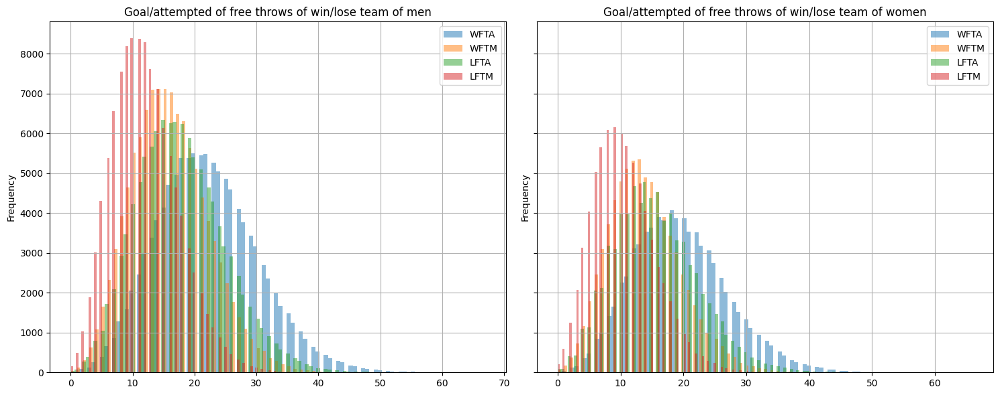

In [54]:
fig, axs = plt.subplots(1, 2, figsize=(15, 6), sharey=True, alpha=0.2)

# Men
for col in ['WFTA', 'WFTM', 'LFTA', 'LFTM']:
    MRegularSeasonDetailedResults[col].hist(bins=100, alpha=0.5, label=col, ax=axs[0])
axs[0].set_title('Goal/attempted of free throws of win/lose team of men')
axs[0].set_xlabel('')
axs[0].set_ylabel('Frequency')
axs[0].legend()

# Women
for col in ['WFTA', 'WFTM', 'LFTA', 'LFTM']:
    WRegularSeasonDetailedResults[col].hist(bins=100, alpha=0.5, label=col, ax=axs[1])
axs[1].set_title('Goal/attempted of free throws of win/lose team of women')
axs[1].set_xlabel('')
axs[1].set_ylabel('Frequency')
axs[1].legend()

plt.tight_layout()
plt.show()


In [55]:
Mprecision_dfft =  pd.DataFrame()
Wprecision_dfft =  pd.DataFrame()

Mprecision_dfft['win'] = MRegularSeasonDetailedResults['WFTM'] / MRegularSeasonDetailedResults['WFTA']
Mprecision_dfft['lose'] = MRegularSeasonDetailedResults['LFTM'] / MRegularSeasonDetailedResults['LFTA']

Wprecision_dfft['win'] = WRegularSeasonDetailedResults['WFTM'] / WRegularSeasonDetailedResults['WFTA']
Wprecision_dfft['lose'] = WRegularSeasonDetailedResults['LFTM'] / WRegularSeasonDetailedResults['LFTA']

print(Mprecision_dfft.mean())
print(Wprecision_dfft.mean())

win     0.713396
lose    0.677784
dtype: float64
win     0.711598
lose    0.676244
dtype: float64


**precision of free throw shot of Men and Women**

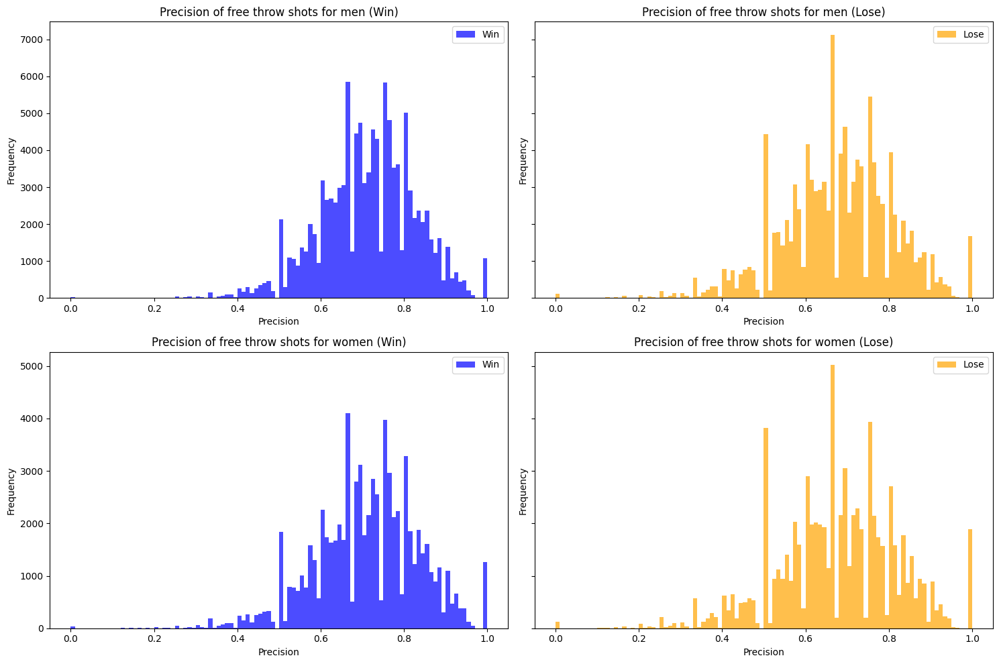

In [56]:
fig, axs = plt.subplots(2, 2, figsize=(15, 10), sharey='row')

# Men - Win
axs[0, 0].hist(Mprecision_dfft['win'], bins=100, alpha=0.7, color='blue', label='Win')
axs[0, 0].set_title('Precision of free throw shots for men (Win)')
axs[0, 0].set_xlabel('Precision')
axs[0, 0].set_ylabel('Frequency')
axs[0, 0].legend()
# Men - Lose
axs[0, 1].hist(Mprecision_dfft['lose'], bins=100, alpha=0.7, color='orange', label='Lose')
axs[0, 1].set_title('Precision of free throw shots for men (Lose)')
axs[0, 1].set_xlabel('Precision')
axs[0, 1].set_ylabel('Frequency')
axs[0, 1].legend()

# Women - Win
axs[1, 0].hist(Wprecision_dfft['win'], bins=100, alpha=0.7, color='blue', label='Win')
axs[1, 0].set_title('Precision of free throw shots for women (Win)')
axs[1, 0].set_xlabel('Precision')
axs[1, 0].set_ylabel('Frequency')
axs[1, 0].legend()
# Women - Lose
axs[1, 1].hist(Wprecision_dfft['lose'], bins=100, alpha=0.7, color='orange', label='Lose')
axs[1, 1].set_title('Precision of free throw shots for women (Lose)')
axs[1, 1].set_xlabel('Precision')
axs[1, 1].set_ylabel('Frequency')
axs[1, 1].legend()

plt.tight_layout()
plt.show()


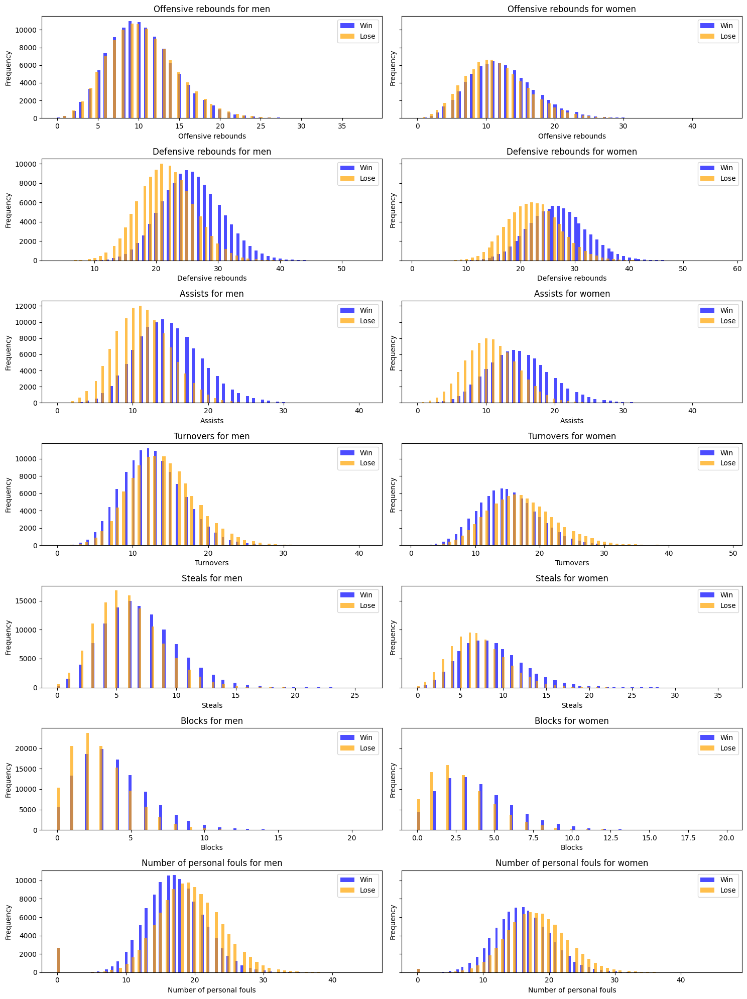

In [57]:
statistics = [['WOR', 'LOR'], ['WDR', 'LDR'], ['WAst', 'LAst'], ['WTO', 'LTO'],
              ['WStl', 'LStl'], ['WBlk', 'LBlk'], ['WPF', 'LPF']]
titles = ['Offensive rebounds', 'Defensive rebounds', 'Assists', 'Turnovers',
          'Steals', 'Blocks', 'Number of personal fouls']

fig, axs = plt.subplots(7, 2, figsize=(15, 20), sharey='row')

for i, (stats, title) in enumerate(zip(statistics, titles)):
    # Men - Win
    axs[i, 0].hist(MRegularSeasonDetailedResults[stats[0]], bins=100, alpha=0.7, color='blue', label='Win')
    # Men - Lose
    axs[i, 0].hist(MRegularSeasonDetailedResults[stats[1]], bins=100, alpha=0.7, color='orange', label='Lose')
    axs[i, 0].set_title(f'{title} for men')
    axs[i, 0].set_xlabel(title)
    axs[i, 0].set_ylabel('Frequency')
    axs[i, 0].legend()

    # Women - Win
    axs[i, 1].hist(WRegularSeasonDetailedResults[stats[0]], bins=100, alpha=0.7, color='blue', label='Win')
    # Women - Lose
    axs[i, 1].hist(WRegularSeasonDetailedResults[stats[1]], bins=100, alpha=0.7, color='orange', label='Lose')
    axs[i, 1].set_title(f'{title} for women')
    axs[i, 1].set_xlabel(title)
    axs[i, 1].set_ylabel('Frequency')
    axs[i, 1].legend()

plt.tight_layout()
plt.show()


**Time in attack" in basketball, also known as "possession time" or "time of possession," refers to the duration of time a team maintains possession of the ball during a game. It measures how long a team spends on offense, attempting to score points, relative to the total duration of the game.**


**Teams aim to maximize their time in attack to create scoring opportunities and control the flow of the game. Possessing the ball allows them to set up plays, pass the ball to open teammates, and take shots at the basket.**

**time in attack = offensive rebounds / (Defensive Rebounds + offensive rebounds)**

In [58]:

WOR_M = MRegularSeasonDetailedResults['WOR']
LOR_M = MRegularSeasonDetailedResults['LOR']
WDR_M = MRegularSeasonDetailedResults['WDR']
LDR_M = MRegularSeasonDetailedResults['LDR']

WOR_W = WRegularSeasonDetailedResults['WOR']
LOR_W = WRegularSeasonDetailedResults['LOR']
WDR_W = WRegularSeasonDetailedResults['WDR']
LDR_W = WRegularSeasonDetailedResults['LDR']

# Calculate time in attack for men
total_OR_M = WOR_M + LOR_M
total_DR_M = WDR_M + LDR_M
time_in_attack_M = total_OR_M / (total_DR_M + total_OR_M)

# Calculate time in attack for men
total_OR_W = WOR_W + LOR_W
total_DR_W = WDR_W + LDR_W
time_in_attack_W = total_OR_W / (total_DR_W + total_OR_W)


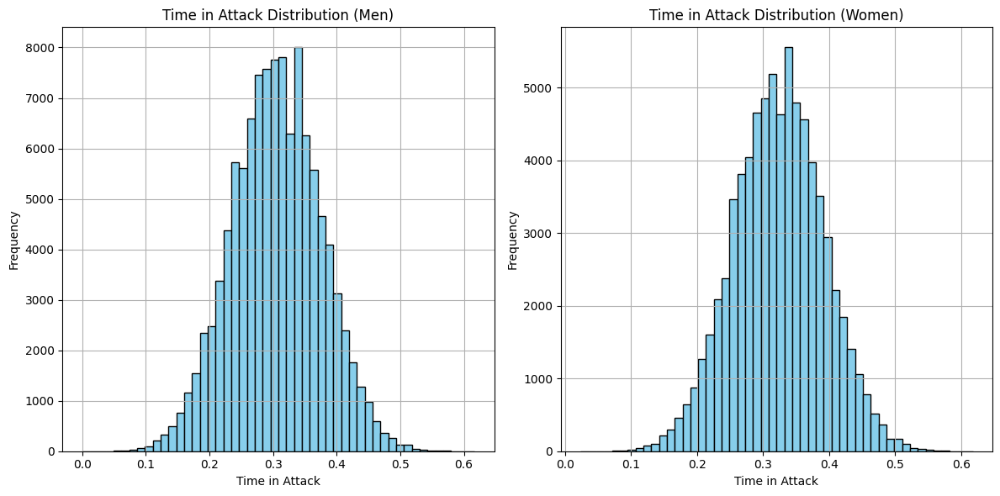

In [59]:
fig, axs = plt.subplots(1, 2, figsize=(12, 6))

# Plot for men
axs[0].hist(time_in_attack_M, bins=50, color='skyblue', edgecolor='black')
axs[0].set_title('Time in Attack Distribution (Men)')
axs[0].set_xlabel('Time in Attack')
axs[0].set_ylabel('Frequency')
axs[0].grid(True)

# Plot for women
axs[1].hist(time_in_attack_W, bins=50, color='skyblue', edgecolor='black')
axs[1].set_title('Time in Attack Distribution (Women)')
axs[1].set_xlabel('Time in Attack')
axs[1].set_ylabel('Frequency')
axs[1].grid(True)

plt.tight_layout()
plt.show()


**In basketball, a turnover occurs when a team loses possession of the ball to the opposing team without attempting a field goal or free throw.**



**Turnovers are a crucial aspect of basketball, as they can lead to scoring opportunities for the opposing team. Coaches often emphasize minimizing turnovers and practicing ball security to maintain possession and control of the game. Tracking turnovers allows teams to evaluate their performance and make adjustments to their strategy to improve their chances of winning.**


**precision of Turnover = Turnover / (Defensive Rebounds + steals)**

In [60]:
# Example data (replace with your actual data)
WTO_M = MRegularSeasonDetailedResults['WTO']
LTO_M = MRegularSeasonDetailedResults['LTO']

WTO_W = WRegularSeasonDetailedResults['WTO']
LTO_W = WRegularSeasonDetailedResults['LTO']

precision_of_turnover_M = (WTO_M + LTO_M) / (MRegularSeasonDetailedResults['WDR'] + MRegularSeasonDetailedResults['LDR'] + MRegularSeasonDetailedResults['WStl'] + MRegularSeasonDetailedResults['LStl'])
precision_of_turnover_W = (WTO_W + LTO_W) / (WRegularSeasonDetailedResults['WDR'] + WRegularSeasonDetailedResults['LDR'] + WRegularSeasonDetailedResults['WStl'] + WRegularSeasonDetailedResults['LStl'])

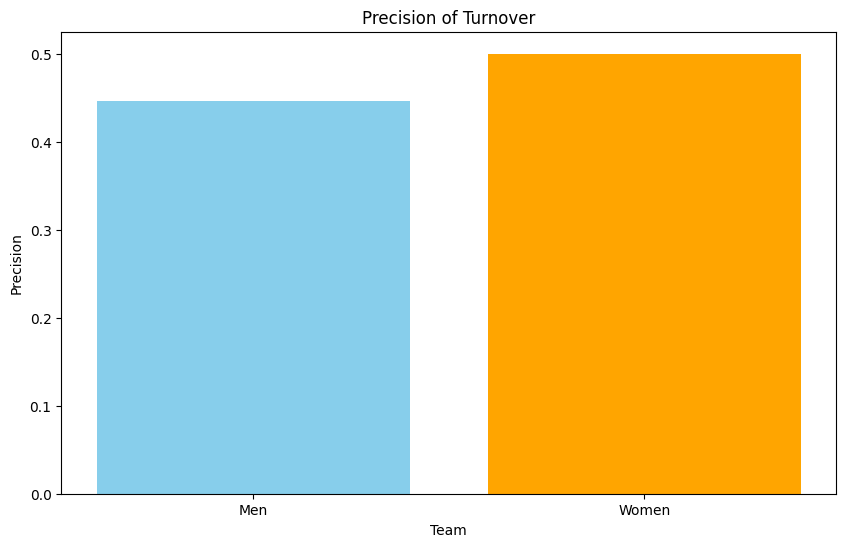

In [61]:
plt.figure(figsize=(10, 6))
plt.bar(['Men', 'Women'], [precision_of_turnover_M.mean(), precision_of_turnover_W.mean()], color=['skyblue', 'orange'])
plt.title('Precision of Turnover')
plt.xlabel('Team')
plt.ylabel('Precision')
plt.show()

**Precision of defenese = steals / defense**

In [62]:
# men
WDR_M = MRegularSeasonDetailedResults['WDR']
LDR_M = MRegularSeasonDetailedResults['LDR']
WStl_M = MRegularSeasonDetailedResults['WStl']
LStl_M = MRegularSeasonDetailedResults['LStl']
WBlk_M = MRegularSeasonDetailedResults['WBlk']
LBlk_M = MRegularSeasonDetailedResults['LBlk']

# women
WDR_W = WRegularSeasonDetailedResults['WDR']
LDR_W = WRegularSeasonDetailedResults['LDR']
WStl_W = WRegularSeasonDetailedResults['WStl']
LStl_W = WRegularSeasonDetailedResults['LStl']
WBlk_W = WRegularSeasonDetailedResults['WBlk']
LBlk_W = WRegularSeasonDetailedResults['LBlk']

precision_of_defense_M = ((WStl_M + LStl_M + WBlk_M + LBlk_M) / (WDR_M + LDR_M + WStl_M + LStl_M + WBlk_M + LBlk_M)) * 100
precision_of_defense_W = ((WStl_W + LStl_W + WBlk_W + LBlk_W) / (WDR_W + LDR_W + WStl_W + LStl_W + WBlk_W + LBlk_W)) * 100


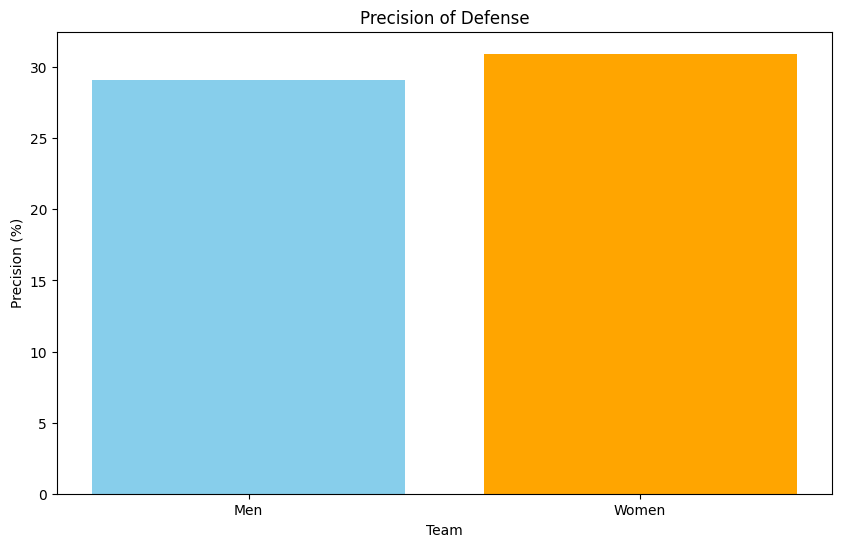

In [63]:
plt.figure(figsize=(10, 6))
plt.bar(['Men', 'Women'], [precision_of_defense_M.mean(), precision_of_defense_W.mean()], color=['skyblue', 'orange'])
plt.title('Precision of Defense')
plt.xlabel('Team')
plt.ylabel('Precision (%)')
plt.show()


In [64]:
MNCAATourneyDetailedResults.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1315 entries, 0 to 1314
Data columns (total 34 columns):
 #   Column   Non-Null Count  Dtype 
---  ------   --------------  ----- 
 0   Season   1315 non-null   int64 
 1   DayNum   1315 non-null   int64 
 2   WTeamID  1315 non-null   int64 
 3   WScore   1315 non-null   int64 
 4   LTeamID  1315 non-null   int64 
 5   LScore   1315 non-null   int64 
 6   WLoc     1315 non-null   object
 7   NumOT    1315 non-null   int64 
 8   WFGM     1315 non-null   int64 
 9   WFGA     1315 non-null   int64 
 10  WFGM3    1315 non-null   int64 
 11  WFGA3    1315 non-null   int64 
 12  WFTM     1315 non-null   int64 
 13  WFTA     1315 non-null   int64 
 14  WOR      1315 non-null   int64 
 15  WDR      1315 non-null   int64 
 16  WAst     1315 non-null   int64 
 17  WTO      1315 non-null   int64 
 18  WStl     1315 non-null   int64 
 19  WBlk     1315 non-null   int64 
 20  WPF      1315 non-null   int64 
 21  LFGM     1315 non-null   int64 
 22  

In [65]:
WNCAATourneyDetailedResults.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 827 entries, 0 to 826
Data columns (total 34 columns):
 #   Column   Non-Null Count  Dtype 
---  ------   --------------  ----- 
 0   Season   827 non-null    int64 
 1   DayNum   827 non-null    int64 
 2   WTeamID  827 non-null    int64 
 3   WScore   827 non-null    int64 
 4   LTeamID  827 non-null    int64 
 5   LScore   827 non-null    int64 
 6   WLoc     827 non-null    object
 7   NumOT    827 non-null    int64 
 8   WFGM     827 non-null    int64 
 9   WFGA     827 non-null    int64 
 10  WFGM3    827 non-null    int64 
 11  WFGA3    827 non-null    int64 
 12  WFTM     827 non-null    int64 
 13  WFTA     827 non-null    int64 
 14  WOR      827 non-null    int64 
 15  WDR      827 non-null    int64 
 16  WAst     827 non-null    int64 
 17  WTO      827 non-null    int64 
 18  WStl     827 non-null    int64 
 19  WBlk     827 non-null    int64 
 20  WPF      827 non-null    int64 
 21  LFGM     827 non-null    int64 
 22  LF

In [66]:
MNCAATourneyDetailedResults.head()

,Season,DayNum,WTeamID,WScore,LTeamID,LScore,WLoc,NumOT,WFGM,WFGA,WFGM3,WFGA3,WFTM,WFTA,WOR,WDR,WAst,WTO,WStl,WBlk,WPF,LFGM,LFGA,LFGM3,LFGA3,LFTM,LFTA,LOR,LDR,LAst,LTO,LStl,LBlk,LPF
0,2003,134,1421,92,1411,84,N,1,32,69,11,29,17,26,14,30,17,12,5,3,22,29,67,12,31,14,31,17,28,16,15,5,0,22
1,2003,136,1112,80,1436,51,N,0,31,66,7,23,11,14,11,36,22,16,10,7,8,20,64,4,16,7,7,8,26,12,17,10,3,15
2,2003,136,1113,84,1272,71,N,0,31,59,6,14,16,22,10,27,18,9,7,4,19,25,69,7,28,14,21,20,22,11,12,2,5,18
3,2003,136,1141,79,1166,73,N,0,29,53,3,7,18,25,11,20,15,18,13,1,19,27,60,7,17,12,17,14,17,20,21,6,6,21
4,2003,136,1143,76,1301,74,N,1,27,64,7,20,15,23,18,20,17,13,8,2,14,25,56,9,21,15,20,10,26,16,14,5,8,19


In [67]:
WNCAATourneyDetailedResults.head()

,Season,DayNum,WTeamID,WScore,LTeamID,LScore,WLoc,NumOT,WFGM,WFGA,WFGM3,WFGA3,WFTM,WFTA,WOR,WDR,WAst,WTO,WStl,WBlk,WPF,LFGM,LFGA,LFGM3,LFGA3,LFTM,LFTA,LOR,LDR,LAst,LTO,LStl,LBlk,LPF
0,2010,138,3124,69,3201,55,N,0,28,57,1,5,12,19,13,24,22,12,6,2,12,21,61,10,34,3,5,17,19,12,18,4,1,18
1,2010,138,3173,67,3395,66,N,0,23,59,9,26,12,19,13,34,13,16,3,10,14,22,73,8,27,14,15,18,26,8,8,8,6,22
2,2010,138,3181,72,3214,37,H,0,26,57,4,13,16,22,13,34,15,11,10,7,11,15,56,4,15,3,8,10,21,4,16,6,4,20
3,2010,138,3199,75,3256,61,H,0,25,63,3,15,22,26,20,27,13,17,8,3,21,21,62,2,20,17,22,16,21,13,16,5,4,24
4,2010,138,3207,62,3265,42,N,0,24,68,8,25,6,8,20,29,16,8,5,5,18,13,60,5,26,11,17,16,22,9,10,3,4,12


### Data Section 3 : The basics
Cities.csv

In [68]:
Cities.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 483 entries, 0 to 482
Data columns (total 3 columns):
 #   Column  Non-Null Count  Dtype 
---  ------  --------------  ----- 
 0   CityID  483 non-null    int64 
 1   City    483 non-null    object
 2   State   483 non-null    object
dtypes: int64(1), object(2)
memory usage: 11.4+ KB


In [69]:
Cities.head()

,CityID,City,State
0,4001,Abilene,TX
1,4002,Akron,OH
2,4003,Albany,NY
3,4004,Albuquerque,NM
4,4005,Allentown,PA


In [70]:
print(f'There are total of {Cities.shape[0]} cities')
print(f"There are {len(Cities['City'].unique())} unique cities and {len(Cities['State'].unique())} unique State")
print(f"and {len(Cities['State'].unique())} unique States")

There are total of 483 cities
There are 454 unique cities and 67 unique State
and 67 unique States


In [71]:
cities_count = Cities['State'].value_counts(ascending=False).reset_index()
cities_count.columns = ['State', 'Count']

fig = px.histogram(
    cities_count,
    x='State',
    y='Count',
    color='State',
    title='cites count by states',
    labels={'State': 'State', 'Count': 'Count of Cities'},
    color_discrete_sequence=px.colors.qualitative.Set3
)

fig.update_layout(
    xaxis=dict(title='State'),
    yaxis=dict(title='Count of Cities'),
    barmode='overlay',
    bargap=0.1
)

fig.show()


In [72]:
MGameCities.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 79483 entries, 0 to 79482
Data columns (total 6 columns):
 #   Column   Non-Null Count  Dtype 
---  ------   --------------  ----- 
 0   Season   79483 non-null  int64 
 1   DayNum   79483 non-null  int64 
 2   WTeamID  79483 non-null  int64 
 3   LTeamID  79483 non-null  int64 
 4   CRType   79483 non-null  object
 5   CityID   79483 non-null  int64 
dtypes: int64(5), object(1)
memory usage: 3.6+ MB


In [73]:
WGameCities.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 75565 entries, 0 to 75564
Data columns (total 6 columns):
 #   Column   Non-Null Count  Dtype 
---  ------   --------------  ----- 
 0   Season   75565 non-null  int64 
 1   DayNum   75565 non-null  int64 
 2   WTeamID  75565 non-null  int64 
 3   LTeamID  75565 non-null  int64 
 4   CRType   75565 non-null  object
 5   CityID   75565 non-null  int64 
dtypes: int64(5), object(1)
memory usage: 3.5+ MB


In [74]:
MGameCities.head()

,Season,DayNum,WTeamID,LTeamID,CRType,CityID
0,2010,7,1143,1293,Regular,4027
1,2010,7,1314,1198,Regular,4061
2,2010,7,1326,1108,Regular,4080
3,2010,7,1393,1107,Regular,4340
4,2010,9,1143,1178,Regular,4027


In [75]:
WGameCities.head()

,Season,DayNum,WTeamID,LTeamID,CRType,CityID
0,2010,11,3103,3237,Regular,4002
1,2010,11,3104,3399,Regular,4085
2,2010,11,3110,3224,Regular,4363
3,2010,11,3111,3267,Regular,4158
4,2010,11,3119,3447,Regular,4367


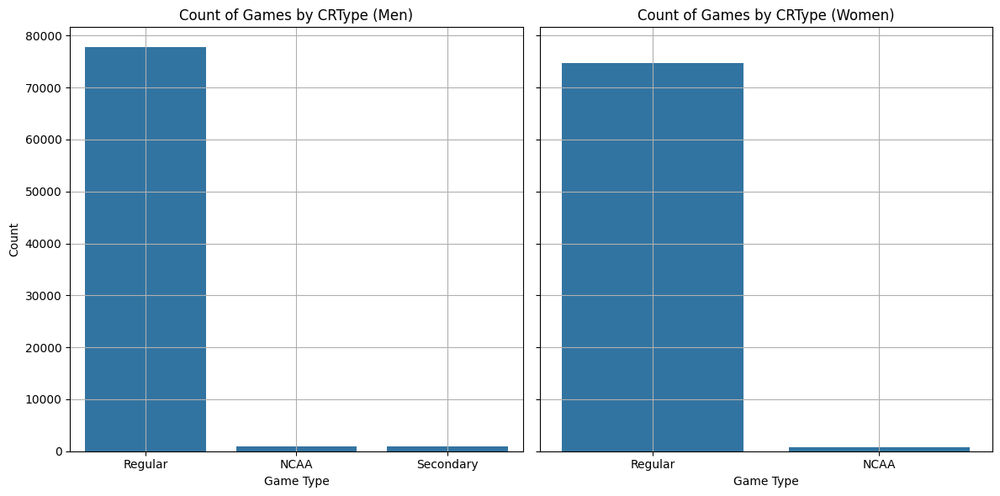

In [76]:

fig, axs = plt.subplots(1, 2, figsize=(12, 6), sharey=True)

sns.countplot(data=MGameCities, x='CRType', ax=axs[0])
axs[0].set_title('Count of Games by CRType (Men)')
axs[0].set_xlabel('Game Type')
axs[0].set_ylabel('Count')
axs[0].grid(True)

sns.countplot(data=WGameCities, x='CRType', ax=axs[1])
axs[1].set_title('Count of Games by CRType (Women)')
axs[1].set_xlabel('Game Type')
axs[1].set_ylabel('Count')
axs[1].grid(True)

plt.tight_layout()
plt.show()


#### Data Section 4 - Public Rankings
MMasseyOrdinals.csv

In [77]:
MMasseyOrdinals.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5166105 entries, 0 to 5166104
Data columns (total 5 columns):
 #   Column         Dtype 
---  ------         ----- 
 0   Season         int64 
 1   RankingDayNum  int64 
 2   SystemName     object
 3   TeamID         int64 
 4   OrdinalRank    int64 
dtypes: int64(4), object(1)
memory usage: 197.1+ MB


In [78]:
MMasseyOrdinals.head()

,Season,RankingDayNum,SystemName,TeamID,OrdinalRank
0,2003,35,SEL,1102,159
1,2003,35,SEL,1103,229
2,2003,35,SEL,1104,12
3,2003,35,SEL,1105,314
4,2003,35,SEL,1106,260


**Showing team rankings from 2002 to 2024**

In [79]:
def show_rank_year(df, year, nbr=10):
    df_tmp = df.copy() 
    df_tmp = df_tmp[df_tmp['Season'] == year]  
    df_best_team = df_tmp.groupby(['TeamID'])['OrdinalRank'].mean().reset_index()
    df_best_team = df_best_team.sort_values(by='OrdinalRank').head(nbr)

    df_2023_best = df_tmp[df_tmp['TeamID'].isin(df_best_team['TeamID'])]
    df_graph = df_2023_best.groupby(['TeamID', 'RankingDayNum'])['OrdinalRank'].mean().reset_index()

    fig = px.line(df_graph,
                  x='RankingDayNum',
                  y='OrdinalRank',
                  color='TeamID',
                  title=f'Team ranking during the season {year}')
    fig.show()


season_tabs = MMasseyOrdinals['Season'].unique()
for year in season_tabs:
    show_rank_year(MMasseyOrdinals, year)


### Data Section 5 - Supplements
MNCAATourneySlots

In [80]:
MNCAATourneySlots.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2452 entries, 0 to 2451
Data columns (total 4 columns):
 #   Column      Non-Null Count  Dtype 
---  ------      --------------  ----- 
 0   Season      2452 non-null   int64 
 1   Slot        2452 non-null   object
 2   StrongSeed  2452 non-null   object
 3   WeakSeed    2452 non-null   object
dtypes: int64(1), object(3)
memory usage: 76.8+ KB


In [81]:
MNCAATourneySlots.head()

,Season,Slot,StrongSeed,WeakSeed
0,1985,R1W1,W01,W16
1,1985,R1W2,W02,W15
2,1985,R1W3,W03,W14
3,1985,R1W4,W04,W13
4,1985,R1W5,W05,W12


In [82]:
WNCAATourneySlots.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1646 entries, 0 to 1645
Data columns (total 4 columns):
 #   Column      Non-Null Count  Dtype 
---  ------      --------------  ----- 
 0   Season      1646 non-null   int64 
 1   Slot        1646 non-null   object
 2   StrongSeed  1646 non-null   object
 3   WeakSeed    1646 non-null   object
dtypes: int64(1), object(3)
memory usage: 51.6+ KB


In [83]:
WNCAATourneySlots.head()

,Season,Slot,StrongSeed,WeakSeed
0,1998,R1W1,W01,W16
1,1998,R1W2,W02,W15
2,1998,R1W3,W03,W14
3,1998,R1W4,W04,W13
4,1998,R1W5,W05,W12


### Data Section 5 - Supplements
MNCAATourneySeedRoundSlots

In [84]:
MNCAATourneySeedRoundSlots.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 720 entries, 0 to 719
Data columns (total 5 columns):
 #   Column       Non-Null Count  Dtype 
---  ------       --------------  ----- 
 0   Seed         720 non-null    object
 1   GameRound    720 non-null    int64 
 2   GameSlot     720 non-null    object
 3   EarlyDayNum  720 non-null    int64 
 4   LateDayNum   720 non-null    int64 
dtypes: int64(3), object(2)
memory usage: 28.3+ KB


In [85]:
MNCAATourneySeedRoundSlots.head()

,Seed,GameRound,GameSlot,EarlyDayNum,LateDayNum
0,W01,1,R1W1,136,137
1,W01,2,R2W1,138,139
2,W01,3,R3W1,143,144
3,W01,4,R4W1,145,146
4,W01,5,R5WX,152,152


**I am preparing to merge the datasets and begin developing machine learning models in the near future**